In [1]:
import pandas as pd
import numpy as np
import openpyxl
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, Binarizer

from feature_engine.imputation import AddMissingIndicator, MeanMedianImputer, CategoricalImputer
from feature_engine.encoding import RareLabelEncoder, OrdinalEncoder
from feature_engine.transformation import LogTransformer
from feature_engine.selection import DropFeatures
from feature_engine.wrappers import SklearnTransformerWrapper


import joblib

In [2]:
dataTrain = pd.read_excel("DB4.xlsx")
dataTrain.shape

(118804, 17)

In [3]:
# Calcular la proporción de valores nulos para cada columna
null_proportions = dataTrain.isnull().mean()

# Imprimir los resultados
for column, proportion in null_proportions.iteritems():
    print(f"% de NA para: '{column}' es: {proportion}")

    # Calcular la proporción de valores nulos para cada columna
null_proportions = dataTrain.isnull().mean()


% de NA para: 'id' es: 0.0002525167502777684
% de NA para: 'year' es: 0.0
% de NA para: 'dia_ocu' es: 0.0
% de NA para: 'mes_ocu' es: 0.0
% de NA para: 'dia_sem_ocu' es: 0.0
% de NA para: 'hora_ocu' es: 0.00027776842530554525
% de NA para: 'depto_ocu' es: 0.0
% de NA para: 'Municipio' es: 0.1196592707316252
% de NA para: 'zona_ocu' es: 0.7682485438200733
% de NA para: 'sexo_fall_les' es: 0.07842328541126561
% de NA para: 'edad_fall_les' es: 0.1321841015454025
% de NA para: 'lesio_fall' es: 4.208612504629474e-05
% de NA para: 'tipo_vehi' es: 0.04685869162654456
% de NA para: 'MARCA' es: 0.45554021750109425
% de NA para: 'COLOR' es: 0.3068667721625534
% de NA para: 'MODELO' es: 0.6874347665061783
% de NA para: 'Causa_acc' es: 0.0005555368506110905


In [4]:
#aquí encontramos las variables que tengan 5% o menos valores nulos, a estas variables se les puede hacer imputación.
cols_con_na = [col for col in dataTrain.columns if (dataTrain[col].isnull().mean() < 0.05)]
cols_con_na

['id',
 'year',
 'dia_ocu',
 'mes_ocu',
 'dia_sem_ocu',
 'hora_ocu',
 'depto_ocu',
 'lesio_fall',
 'tipo_vehi',
 'Causa_acc']

In [5]:
nuevo_df = dataTrain.loc[:, cols_con_na]
print(nuevo_df)

              id  year  dia_ocu     mes_ocu dia_sem_ocu  hora_ocu  \
0            NaN  2010       23  Septiembre      Jueves       7.0   
1            NaN  2010       23  Septiembre      Jueves       7.0   
2            NaN  2010       28       Marzo     Domingo       4.0   
3            NaN  2010        7      Agosto      Sabado       8.0   
4            NaN  2010        5       Julio       Lunes      20.0   
...          ...   ...      ...         ...         ...       ...   
118799  118770.0  2022       31   Diciembre      Sabado      22.0   
118800  118771.0  2022       31   Diciembre      Sabado      23.0   
118801  118772.0  2022       31   Diciembre      Sabado      18.0   
118802  118773.0  2022       31   Diciembre      Sabado      21.0   
118803  118774.0  2022       31   Diciembre      Sabado      22.0   

            depto_ocu lesio_fall    tipo_vehi  Causa_acc  
0           Guatemala  Lesionado    Automovil   Colision  
1           Guatemala  Lesionado    Automovil   Colis

In [6]:
data_numericas = nuevo_df.select_dtypes(include=['float', 'int'])
data_numericas

,id,year,dia_ocu,hora_ocu
0,NaN,2010,23,7.0
1,NaN,2010,23,7.0
2,NaN,2010,28,4.0
3,NaN,2010,7,8.0
4,NaN,2010,5,20.0
...,...,...,...,...
118799,118770.0,2022,31,22.0
118800,118771.0,2022,31,23.0
118801,118772.0,2022,31,18.0
118802,118773.0,2022,31,21.0


In [7]:
df = nuevo_df

In [8]:
def getDateColTypes(df):
    categoricas = []
    continuas = []
    discretas = []

    for colName in df.columns:
        if df[colName].dtype == "O":
            categoricas.append(colName)
        else:
            if((df[colName].dtype == "int64" or df[colName].dtypes == 'float64')):
                if (len(df[colName]) <=30):
                    discretas.append(colName)
                else:
                    continuas.append(colName)

    return discretas,continuas, categoricas


In [9]:
discretas,continuas, categoricas = getDateColTypes(df)

In [10]:
categoricas

['mes_ocu', 'dia_sem_ocu', 'depto_ocu', 'lesio_fall', 'tipo_vehi', 'Causa_acc']

In [11]:
discretas

[]

## Variables Categóricas

In [12]:
categoricas_df = dataTrain.loc[:, categoricas]
print(categoricas_df)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  
0        Colision  
1        Colision  
2        Colision  
3        Colision  
4        Colision  
...

## Variables Continuas

In [13]:
continuas_df = dataTrain.loc[:, continuas]
print(continuas_df)

              id  year  dia_ocu  hora_ocu
0            NaN  2010       23       7.0
1            NaN  2010       23       7.0
2            NaN  2010       28       4.0
3            NaN  2010        7       8.0
4            NaN  2010        5      20.0
...          ...   ...      ...       ...
118799  118770.0  2022       31      22.0
118800  118771.0  2022       31      23.0
118801  118772.0  2022       31      18.0
118802  118773.0  2022       31      21.0
118803  118774.0  2022       31      22.0

[118804 rows x 4 columns]


### Imputación continuas

In [14]:
def imputar_media(datos, columna):
    # Imputar valores faltantes con la media de la columna
    media = datos[columna].mean()
    datos_imputados = datos.copy()
    datos_imputados[columna].fillna(media, inplace=True)
    return datos_imputados

for columna in continuas:
    # Imputar valores faltantes con la media de la columna
    datos_imputados_media = imputar_media(df, columna)
    print(f"Datos imputados con media en columna {columna}:")
    print(datos_imputados_media.head())

Datos imputados con media en columna id:
        id  year  dia_ocu     mes_ocu dia_sem_ocu  hora_ocu  depto_ocu  \
0  59387.5  2010       23  Septiembre      Jueves       7.0  Guatemala   
1  59387.5  2010       23  Septiembre      Jueves       7.0  Guatemala   
2  59387.5  2010       28       Marzo     Domingo       4.0  Guatemala   
3  59387.5  2010        7      Agosto      Sabado       8.0  Guatemala   
4  59387.5  2010        5       Julio       Lunes      20.0  Guatemala   

  lesio_fall  tipo_vehi Causa_acc  
0  Lesionado  Automovil  Colision  
1  Lesionado  Automovil  Colision  
2  Fallecido  Automovil  Colision  
3  Lesionado  Automovil  Colision  
4  Lesionado  Automovil  Colision  
Datos imputados con media en columna year:
   id  year  dia_ocu     mes_ocu dia_sem_ocu  hora_ocu  depto_ocu lesio_fall  \
0 NaN  2010       23  Septiembre      Jueves       7.0  Guatemala  Lesionado   
1 NaN  2010       23  Septiembre      Jueves       7.0  Guatemala  Lesionado   
2 NaN  2010    

### Imputación Categóricas

In [15]:
def imputar_categorico(datos):
    datos_imputados = categoricas_df.copy()
    for columna in categoricas_df.columns:
        moda = categoricas_df[columna].mode().iloc[0]  # Obtener la moda
        datos_imputados[columna].fillna(moda, inplace=True)
    return datos_imputados

df_imputado_cat = imputar_categorico(categoricas_df)

print("DataFrame categoricas imputado:")
print(df_imputado_cat.head())

DataFrame categoricas imputado:
      mes_ocu dia_sem_ocu  depto_ocu lesio_fall  tipo_vehi Causa_acc
0  Septiembre      Jueves  Guatemala  Lesionado  Automovil  Colision
1  Septiembre      Jueves  Guatemala  Lesionado  Automovil  Colision
2       Marzo     Domingo  Guatemala  Fallecido  Automovil  Colision
3      Agosto      Sabado  Guatemala  Lesionado  Automovil  Colision
4       Julio       Lunes  Guatemala  Lesionado  Automovil  Colision


### Codificacion categorica

In [16]:
df_imputado_cat.isnull().mean() #porcentaje

mes_ocu        0.0
dia_sem_ocu    0.0
depto_ocu      0.0
lesio_fall     0.0
tipo_vehi      0.0
Causa_acc      0.0
dtype: float64

In [17]:
datos_imputados_media.isnull().mean() #porcentaje

id             0.000253
year           0.000000
dia_ocu        0.000000
mes_ocu        0.000000
dia_sem_ocu    0.000000
hora_ocu       0.000000
depto_ocu      0.000000
lesio_fall     0.000042
tipo_vehi      0.046859
Causa_acc      0.000556
dtype: float64

In [18]:

counts1 = df_imputado_cat['mes_ocu'].value_counts()
print(counts1)


Diciembre     11913
Marzo         11049
Abril         10186
Noviembre     10083
Enero          9973
Agosto         9855
Mayo           9577
Febrero        9527
Septiembre     9376
Julio          9317
Octubre        9262
Junio          8686
Name: mes_ocu, dtype: int64


In [19]:
counts2 = df_imputado_cat['dia_sem_ocu'].value_counts()
print(counts2)

Domingo      22745
Sabado       22018
Viernes      16033
Lunes        15937
Jueves       14782
Martes       13716
Miercoles    13573
Name: dia_sem_ocu, dtype: int64


In [20]:
counts3 = df_imputado_cat['depto_ocu'].value_counts()
print(counts3)

Guatemala         36977
Escuintla          9503
Alta Verapaz       6067
Chimaltenango      4879
Quetzaltenango     4601
Peten              4463
Suchitepequez      4361
Izabal             4225
Sacatepequez       4021
Santa Rosa         3989
Quiche             3787
Jutiapa            3613
San Marcos         3602
Zacapa             3487
Huehuetenango      3238
Retalhuleu         3122
El Progreso        3001
Chiquimula         2945
Solola             2549
Baja Verapaz       2389
Jalapa             1976
Totonicapan        1204
Santa rosa          413
El progreso         255
Totonicapan         137
Name: depto_ocu, dtype: int64


In [21]:
counts4 = df_imputado_cat['lesio_fall'].value_counts()
print(counts4)

Lesionado    99291
Fallecido    19513
Name: lesio_fall, dtype: int64


In [22]:
counts5 = df_imputado_cat['tipo_vehi'].value_counts()
print(counts5)

Motocicleta         51261
Pick up             19174
Automovil           16645
Bus urbano           5466
Camioneta            5401
Camion               4974
Bus extraurbano      4161
Microbús             3276
Microbus             2495
Moto taxi            1610
Cabezal              1369
MicrobúsMicrobús      837
Panel                 615
Mototaxi              491
Taxi                  271
Bicicleta             245
Cuatrimoto            200
Jeep                  171
Tractor                62
Bus escolar            45
Bus Militar            15
Grúa                    7
Grua                    4
Furgon                  4
Montacargas             2
Furgoneta               2
Motos acuáticas         1
Name: tipo_vehi, dtype: int64


In [23]:
counts6 = df_imputado_cat['Causa_acc'].value_counts()
print(counts6)

Colision                                     68814
Atropello                                    22199
vuelco, volco                                13409
Caida, encuneto, encunetado, embarrancado     6173
Derrape                                       3338
ATROPELLO                                     2774
Choque, empotro                               2089
Erupcion volcanica, deslave, derrumbe            8
Name: Causa_acc, dtype: int64


Codificando las categoricas

In [24]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder


# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['mes_codificado'] = label_encoder.fit_transform(df_imputado_cat['mes_ocu']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)



           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  
0        Colision              12  
1        Colision              12  
2        Colisi

In [25]:
# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['vehiculo_codificado'] = label_encoder.fit_transform(df_imputado_cat['tipo_vehi']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  
0        Colision              12                    1  
1        

In [26]:
# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['ocu_codificado'] = label_encoder.fit_transform(df_imputado_cat['lesio_fall']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  ocu_codificado  
0        Colision              12                 

In [27]:
# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['causa_codificado'] = label_encoder.fit_transform(df_imputado_cat['Causa_acc']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  ocu_codificado  \
0        Colision              12                

In [28]:
# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['depto_codificado'] = label_encoder.fit_transform(df_imputado_cat['depto_ocu']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  ocu_codificado  \
0        Colision              12                

In [29]:
# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['dia_codificado'] = label_encoder.fit_transform(df_imputado_cat['dia_sem_ocu']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  ocu_codificado  \
0        Colision              12                

In [30]:
# Inicializar el codificador de etiquetas
label_encoder = LabelEncoder()

# Ajustar y transformar los datos de la variable 'mes'
df_imputado_cat['mes_codificado'] = label_encoder.fit_transform(df_imputado_cat['mes_ocu']) + 1

# Imprimir el DataFrame resultante
print(df_imputado_cat)

           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  ocu_codificado  \
0        Colision              12                

In [31]:
# Copiar el dataset a otro DataFrame
df_copia = df_imputado_cat.copy()

# Mostrar el nuevo DataFrame copiado
print(df_copia)



           mes_ocu dia_sem_ocu      depto_ocu lesio_fall    tipo_vehi  \
0       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
1       Septiembre      Jueves      Guatemala  Lesionado    Automovil   
2            Marzo     Domingo      Guatemala  Fallecido    Automovil   
3           Agosto      Sabado      Guatemala  Lesionado    Automovil   
4            Julio       Lunes      Guatemala  Lesionado    Automovil   
...            ...         ...            ...        ...          ...   
118799   Diciembre      Sabado      Guatemala  Lesionado    Automovil   
118800   Diciembre      Sabado      Guatemala  Lesionado     Microbús   
118801   Diciembre      Sabado     Santa Rosa  Fallecido      Pick up   
118802   Diciembre      Sabado  Suchitepequez  Lesionado  Motocicleta   
118803   Diciembre      Sabado   Sacatepequez  Lesionado  Motocicleta   

        Causa_acc  mes_codificado  vehiculo_codificado  ocu_codificado  \
0        Colision              12                

In [32]:
# Lista de columnas a eliminar
columnas_eliminar = ['mes_ocu', 'dia_sem_ocu', 'depto_ocu', 'tipo_vehi', 'Causa_acc']

# Eliminar las columnas del DataFrame copiado
df_copia = df_copia.drop(columnas_eliminar, axis=1)

# Mostrar el DataFrame resultante
print(df_copia)


       lesio_fall  mes_codificado  vehiculo_codificado  ocu_codificado  \
0       Lesionado              12                    1               2   
1       Lesionado              12                    1               2   
2       Fallecido               8                    1               1   
3       Lesionado               2                    1               2   
4       Lesionado               6                    1               2   
...           ...             ...                  ...             ...   
118799  Lesionado               3                    1               2   
118800  Lesionado               3                   17               2   
118801  Fallecido               3                   25               1   
118802  Lesionado               3                   21               2   
118803  Lesionado               3                   21               2   

        causa_codificado  depto_codificado  dia_codificado  
0                      5                 8        

### Outliers

In [33]:
dataset = df


def getColumnTypes(dataset):
    '''Descripcion: Esta funcion extrae el tipo de dominio de las columnas de un dataset.
    Entradas: Pandas Dataframe
    Salida> Tupla con arreglo que contiene nombres de las columnas.'''

    continuas = []
    discretas = []
    categoricas = []

    for col in dataset.columns:
        if((dataset[col].dtype == 'int64') or (dataset[col].dtype == 'float64')):
            if(len(dataset[col].unique())>30):
                continuas.append(col)
            else:
                discretas.append(col)
        else:
            categoricas.append(col)
    return continuas, discretas, categoricas

In [34]:
import scipy.stats as stats

In [35]:
def plotDistBoxQQ(dataset, col):
    '''
    Descripción: Muestra las gráficas de Distribución, Boxplot y QQ-Plot para detectar Outliers.
    Imput: Dataset -> pandas dataframe, col -> string con nombre de columna
    Output: Visualización de plots.
    '''
    plt.figure(figsize=(20,6))

    plt.subplot(1,3,1) #grafica de 3 columnas y 1 fila
    sns.distplot(dataset[col], bins=30)
    plt.title("Histograma y Densidad")

    plt.subplot(1,3,2)
    sns.boxplot(y=dataset[col])
    plt.title('Boxplot')

    plt.subplot(1,3,3)
    stats.probplot(dataset[col], dist="norm", plot=plt)
    plt.title('Q-Q plot')

c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

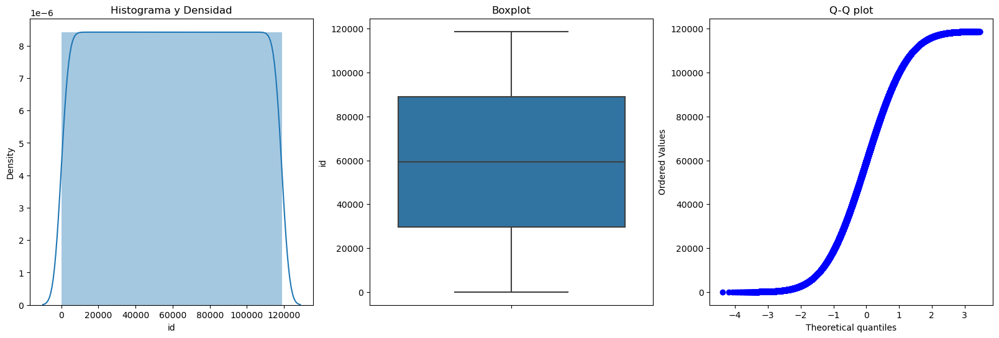

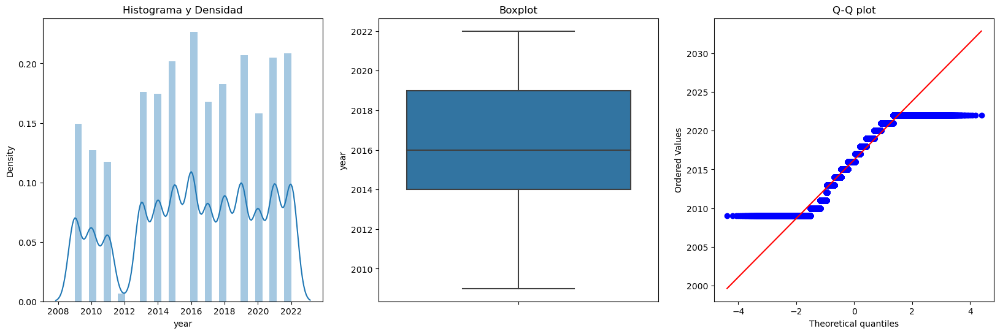

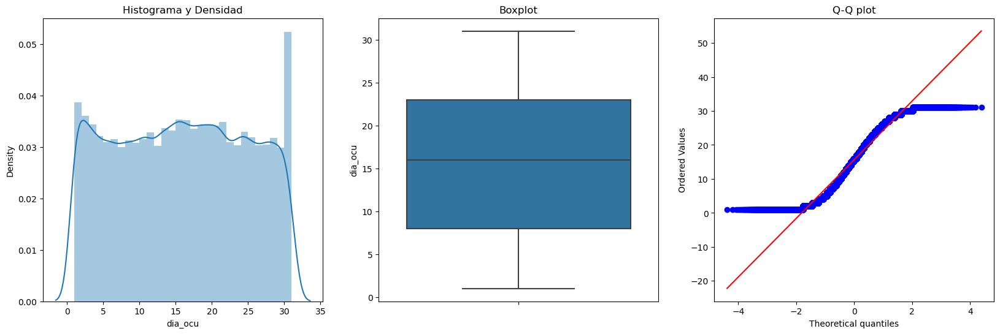

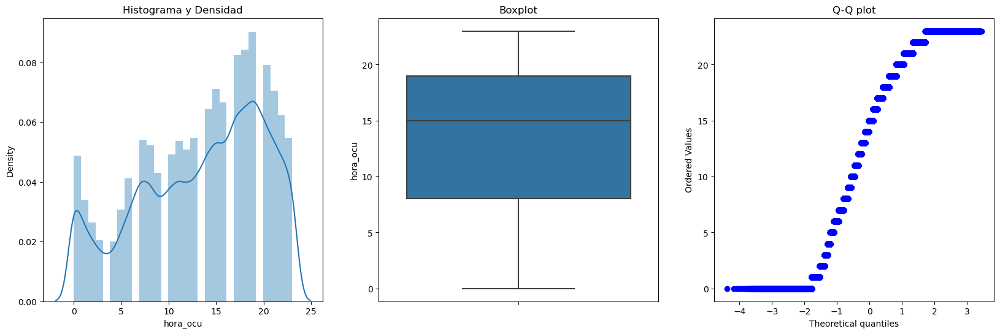

In [36]:
for col in continuas:
    
    plotDistBoxQQ(df,col)

# PARTE 3

Procedemos a realiar modelos con las variables numericas 

In [37]:
df_copia2= df_copia.drop('lesio_fall', axis=1)
print(df_copia2)

        mes_codificado  vehiculo_codificado  ocu_codificado  causa_codificado  \
0                   12                    1               2                 5   
1                   12                    1               2                 5   
2                    8                    1               1                 5   
3                    2                    1               2                 5   
4                    6                    1               2                 5   
...                ...                  ...             ...               ...   
118799               3                    1               2                 2   
118800               3                   17               2                 2   
118801               3                   25               1                 2   
118802               3                   21               2                 2   
118803               3                   21               2                 2   

        depto_codificado  d

In [38]:
print(df_copia2)

        mes_codificado  vehiculo_codificado  ocu_codificado  causa_codificado  \
0                   12                    1               2                 5   
1                   12                    1               2                 5   
2                    8                    1               1                 5   
3                    2                    1               2                 5   
4                    6                    1               2                 5   
...                ...                  ...             ...               ...   
118799               3                    1               2                 2   
118800               3                   17               2                 2   
118801               3                   25               1                 2   
118802               3                   21               2                 2   
118803               3                   21               2                 2   

        depto_codificado  d

In [39]:
data_numericas.head()


,id,year,dia_ocu,hora_ocu
0,NaN,2010,23,7.0
1,NaN,2010,23,7.0
2,NaN,2010,28,4.0
3,NaN,2010,7,8.0
4,NaN,2010,5,20.0


In [40]:
df3 = pd.concat([df_copia2, data_numericas],axis=1)
df3.shape


(118804, 10)

In [41]:
df3.isnull().mean() #porcentaje

mes_codificado         0.000000
vehiculo_codificado    0.000000
ocu_codificado         0.000000
causa_codificado       0.000000
depto_codificado       0.000000
dia_codificado         0.000000
id                     0.000253
year                   0.000000
dia_ocu                0.000000
hora_ocu               0.000278
dtype: float64

In [42]:
df3.dtypes

mes_codificado           int32
vehiculo_codificado      int32
ocu_codificado           int32
causa_codificado         int32
depto_codificado         int32
dia_codificado           int32
id                     float64
year                     int64
dia_ocu                  int64
hora_ocu               float64
dtype: object

In [43]:
dfc2 = df3.copy()

# Mostrar el nuevo DataFrame copiado
print(dfc2)


        mes_codificado  vehiculo_codificado  ocu_codificado  causa_codificado  \
0                   12                    1               2                 5   
1                   12                    1               2                 5   
2                    8                    1               1                 5   
3                    2                    1               2                 5   
4                    6                    1               2                 5   
...                ...                  ...             ...               ...   
118799               3                    1               2                 2   
118800               3                   17               2                 2   
118801               3                   25               1                 2   
118802               3                   21               2                 2   
118803               3                   21               2                 2   

        depto_codificado  d

In [44]:
print(dfc2)

        mes_codificado  vehiculo_codificado  ocu_codificado  causa_codificado  \
0                   12                    1               2                 5   
1                   12                    1               2                 5   
2                    8                    1               1                 5   
3                    2                    1               2                 5   
4                    6                    1               2                 5   
...                ...                  ...             ...               ...   
118799               3                    1               2                 2   
118800               3                   17               2                 2   
118801               3                   25               1                 2   
118802               3                   21               2                 2   
118803               3                   21               2                 2   

        depto_codificado  d

In [45]:
df_cleaned = dfc2.dropna()

# Mostrar el DataFrame resultante
print(df_cleaned)


        mes_codificado  vehiculo_codificado  ocu_codificado  causa_codificado  \
30                   8                    6               2                 8   
31                   8                    6               2                 8   
32                   8                    6               2                 8   
33                   8                    6               2                 8   
34                   8                    6               2                 8   
...                ...                  ...             ...               ...   
118799               3                    1               2                 2   
118800               3                   17               2                 2   
118801               3                   25               1                 2   
118802               3                   21               2                 2   
118803               3                   21               2                 2   

        depto_codificado  d

In [46]:
import numpy as np

# Verificar si hay valores NaN en el dataset dfc2
nan_mask = np.isnan(df_cleaned)

In [47]:
rows_with_nan = df_cleaned[nan_mask.any(axis=1)]


In [48]:
rows_with_nan.shape

(0, 10)

# Modelos de Clasificación y Predicción

In [49]:
X = df_cleaned.drop(['dia_codificado','year','vehiculo_codificado','mes_codificado'], axis=1)
y = df_cleaned['dia_codificado']

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=125)

### Estandarización de variables

In [51]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

In [52]:
scaler = StandardScaler()
scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)


## Regresion Logistica

In [53]:
from sklearn.linear_model import LogisticRegression

logit = LogisticRegression()

logit = LogisticRegression(max_iter=2023)  # Increase the maximum number of iterations
logit = LogisticRegression(tol=0.001)  # Increase the convergence tolerance

logit.fit(X_train_std, y_train)
logit_preds = logit.predict(X_test_std)
logit


LogisticRegression(tol=0.001)

In [54]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix

# Suponiendo que has entrenado el modelo LogisticRegression y obtenido las predicciones
logit = LogisticRegression()
logit.fit(X_train, y_train)
logit_preds = logit.predict(X_test)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, logit_preds)

# Calcular las probabilidades de predicción del modelo
y_pred_proba = logit.predict_proba(X_test)[:, 1]

cm = confusion_matrix(y_test, logit_preds)
print(cm)
print(f"Accuracy:{accuracy}")
print(f"Probablilidades de Predicción:{y_pred_proba}")


[[   0    0    0    0    0 6992    0]
 [   0    0    0    0    0 4330    0]
 [   0    0    0    0    0 4740    0]
 [   0    0    0    0    0 4036    0]
 [   0    0    0    0    0 4124    0]
 [   0    0    0    0    0 6595    0]
 [   0    0    0    0    0 4806    0]]
Accuracy:0.18513320046037673
Probablilidades de Predicción:[0.11878898 0.11925916 0.12204368 ... 0.14067835 0.11680197 0.12089021]


Random Forest

In [64]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador Random Forest
random_forest = RandomForestClassifier()

# Entrenar el modelo utilizando el conjunto de entrenamiento
random_forest.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = random_forest.predict(X_test)
y_pred_proba = random_forest.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))




Precisión: 0.60
Matriz de Confusión:
[[4706  337  373  245  266  711  354]
 [ 457 2400  264  228  221  461  299]
 [ 517  285 2760  224  210  455  289]
 [ 439  214  246 2263  181  447  246]
 [ 472  271  245  178 2206  476  276]
 [ 748  353  335  249  302 4212  396]
 [ 549  282  284  203  252  561 2675]]
Probabilidad de Predicción:
Instancia 1: Clase 2, Probabilidad 0.42
Instancia 2: Clase 4, Probabilidad 0.51
Instancia 3: Clase 5, Probabilidad 0.28
Instancia 4: Clase 4, Probabilidad 0.42
Instancia 5: Clase 1, Probabilidad 0.26
Instancia 6: Clase 5, Probabilidad 0.51
Instancia 7: Clase 6, Probabilidad 1.00
Instancia 8: Clase 3, Probabilidad 0.27
Instancia 9: Clase 3, Probabilidad 1.00
Instancia 10: Clase 2, Probabilidad 0.23
Instancia 11: Clase 5, Probabilidad 0.73
Instancia 12: Clase 1, Probabilidad 0.54
Instancia 13: Clase 2, Probabilidad 0.34
Instancia 14: Clase 6, Probabilidad 0.34
Instancia 15: Clase 5, Probabilidad 1.00
Instancia 16: Clase 5, Probabilidad 0.22
Instancia 17: Clase 6

Naive Bayes

In [65]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador Naive Bayes
naive_bayes = GaussianNB()

# Entrenar el modelo utilizando el conjunto de entrenamiento
naive_bayes.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = naive_bayes.predict(X_test)
y_pred_proba = naive_bayes.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))


Precisión: 0.20
Matriz de Confusión:
[[3617    0    0   18    0 3357    0]
 [2107    0    0    4    0 2219    0]
 [2341    0    0   12    0 2387    0]
 [1961    0    0    9    0 2066    0]
 [1970    0    0    9    0 2145    0]
 [3125    0    0   13    0 3457    0]
 [2189    0    0    7    0 2610    0]]
Probabilidad de Predicción:
Instancia 1: Clase 5, Probabilidad 0.19
Instancia 2: Clase 0, Probabilidad 0.20
Instancia 3: Clase 5, Probabilidad 0.17
Instancia 4: Clase 5, Probabilidad 0.21
Instancia 5: Clase 5, Probabilidad 0.20
Instancia 6: Clase 5, Probabilidad 0.21
Instancia 7: Clase 0, Probabilidad 0.19
Instancia 8: Clase 0, Probabilidad 0.18
Instancia 9: Clase 0, Probabilidad 0.23
Instancia 10: Clase 5, Probabilidad 0.19
Instancia 11: Clase 5, Probabilidad 0.20
Instancia 12: Clase 5, Probabilidad 0.19
Instancia 13: Clase 0, Probabilidad 0.19
Instancia 14: Clase 0, Probabilidad 0.18
Instancia 15: Clase 5, Probabilidad 0.19
Instancia 16: Clase 0, Probabilidad 0.18
Instancia 17: Clase 0

LDA

In [66]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador LDA
lda = LinearDiscriminantAnalysis()

# Entrenar el modelo utilizando el conjunto de entrenamiento
lda.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = lda.predict(X_test)
y_pred_proba = lda.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))



Precisión: 0.20
Matriz de Confusión:
[[4012    0    0    0    0 2980    0]
 [2421    0    0    0    0 1909    0]
 [2638    0    0    0    0 2102    0]
 [2210    0    0    0    0 1826    0]
 [2228    0    0    0    0 1896    0]
 [3496    0    0    0    0 3099    0]
 [2458    0    0    0    0 2348    0]]
Probabilidad de Predicción:
Instancia 1: Clase 5, Probabilidad 0.19
Instancia 2: Clase 0, Probabilidad 0.20
Instancia 3: Clase 5, Probabilidad 0.20
Instancia 4: Clase 5, Probabilidad 0.20
Instancia 5: Clase 5, Probabilidad 0.19
Instancia 6: Clase 5, Probabilidad 0.21
Instancia 7: Clase 5, Probabilidad 0.19
Instancia 8: Clase 0, Probabilidad 0.20
Instancia 9: Clase 0, Probabilidad 0.21
Instancia 10: Clase 0, Probabilidad 0.19
Instancia 11: Clase 5, Probabilidad 0.19
Instancia 12: Clase 5, Probabilidad 0.19
Instancia 13: Clase 0, Probabilidad 0.19
Instancia 14: Clase 0, Probabilidad 0.19
Instancia 15: Clase 5, Probabilidad 0.19
Instancia 16: Clase 5, Probabilidad 0.18
Instancia 17: Clase 0

Arbol de desicion

In [67]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador de Árboles de Decisión
decision_tree = DecisionTreeClassifier()

# Entrenar el modelo utilizando el conjunto de entrenamiento
decision_tree.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = decision_tree.predict(X_test)
y_pred_proba = decision_tree.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))


Precisión: 0.63
Matriz de Confusión:
[[4739  327  427  284  257  563  395]
 [ 310 2606  252  254  279  308  321]
 [ 386  266 2969  253  265  338  263]
 [ 301  244  298 2469  210  307  207]
 [ 304  286  235  210 2448  379  262]
 [ 527  339  337  268  305 4408  411]
 [ 373  353  276  237  251  408 2908]]
Probabilidad de Predicción:
Instancia 1: Clase 0, Probabilidad 1.00
Instancia 2: Clase 0, Probabilidad 1.00
Instancia 3: Clase 1, Probabilidad 1.00
Instancia 4: Clase 5, Probabilidad 1.00
Instancia 5: Clase 1, Probabilidad 1.00
Instancia 6: Clase 1, Probabilidad 1.00
Instancia 7: Clase 6, Probabilidad 1.00
Instancia 8: Clase 0, Probabilidad 1.00
Instancia 9: Clase 3, Probabilidad 1.00
Instancia 10: Clase 1, Probabilidad 1.00
Instancia 11: Clase 6, Probabilidad 1.00
Instancia 12: Clase 1, Probabilidad 1.00
Instancia 13: Clase 0, Probabilidad 1.00
Instancia 14: Clase 6, Probabilidad 1.00
Instancia 15: Clase 5, Probabilidad 1.00
Instancia 16: Clase 1, Probabilidad 1.00
Instancia 17: Clase 6

Análisis de discriminante lineal

In [68]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador de Análisis de Discriminante Lineal (LDA)
lda = LinearDiscriminantAnalysis()

# Entrenar el modelo utilizando el conjunto de entrenamiento
lda.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = lda.predict(X_test)
y_pred_proba = lda.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))


Precisión: 0.20
Matriz de Confusión:
[[4012    0    0    0    0 2980    0]
 [2421    0    0    0    0 1909    0]
 [2638    0    0    0    0 2102    0]
 [2210    0    0    0    0 1826    0]
 [2228    0    0    0    0 1896    0]
 [3496    0    0    0    0 3099    0]
 [2458    0    0    0    0 2348    0]]
Probabilidad de Predicción:
Instancia 1: Clase 5, Probabilidad 0.19
Instancia 2: Clase 0, Probabilidad 0.20
Instancia 3: Clase 5, Probabilidad 0.20
Instancia 4: Clase 5, Probabilidad 0.20
Instancia 5: Clase 5, Probabilidad 0.19
Instancia 6: Clase 5, Probabilidad 0.21
Instancia 7: Clase 5, Probabilidad 0.19
Instancia 8: Clase 0, Probabilidad 0.20
Instancia 9: Clase 0, Probabilidad 0.21
Instancia 10: Clase 0, Probabilidad 0.19
Instancia 11: Clase 5, Probabilidad 0.19
Instancia 12: Clase 5, Probabilidad 0.19
Instancia 13: Clase 0, Probabilidad 0.19
Instancia 14: Clase 0, Probabilidad 0.19
Instancia 15: Clase 5, Probabilidad 0.19
Instancia 16: Clase 5, Probabilidad 0.18
Instancia 17: Clase 0

 Análisis de Discriminante Cuadrático (QDA) 

In [69]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador de Análisis de Discriminante Cuadrático (QDA)
qda = QuadraticDiscriminantAnalysis()

# Entrenar el modelo utilizando el conjunto de entrenamiento
qda.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = qda.predict(X_test)
y_pred_proba = qda.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))


Precisión: 0.20
Matriz de Confusión:
[[3781    2  107  173    1 2926    2]
 [2198    1   91   78    3 1955    4]
 [2469    1   98   83    8 2073    8]
 [2058    3   90  106    7 1765    7]
 [2040    5   82   77    3 1907   10]
 [3320    1  120  150    5 2989   10]
 [2445    1   76   76    9 2198    1]]
Probabilidad de Predicción:
Instancia 1: Clase 5, Probabilidad 0.18
Instancia 2: Clase 0, Probabilidad 0.20
Instancia 3: Clase 5, Probabilidad 0.21
Instancia 4: Clase 5, Probabilidad 0.21
Instancia 5: Clase 5, Probabilidad 0.20
Instancia 6: Clase 5, Probabilidad 0.26
Instancia 7: Clase 0, Probabilidad 0.19
Instancia 8: Clase 0, Probabilidad 0.21
Instancia 9: Clase 0, Probabilidad 0.22
Instancia 10: Clase 0, Probabilidad 0.18
Instancia 11: Clase 5, Probabilidad 0.18
Instancia 12: Clase 5, Probabilidad 0.18
Instancia 13: Clase 0, Probabilidad 0.20
Instancia 14: Clase 0, Probabilidad 0.18
Instancia 15: Clase 0, Probabilidad 0.19
Instancia 16: Clase 0, Probabilidad 0.17
Instancia 17: Clase 0

AdaBoost

In [70]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear una instancia del clasificador AdaBoost
adaboost = AdaBoostClassifier()

# Entrenar el modelo utilizando el conjunto de entrenamiento
adaboost.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = adaboost.predict(X_test)
y_pred_proba = adaboost.predict_proba(X_test)  # Probabilidad de predicción

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))


Precisión: 0.20
Matriz de Confusión:
[[3635   13  119  170   58 2963   34]
 [1982   16  101  112   38 2060   21]
 [2210   15  174  122   66 2118   35]
 [1852   10   97  173   50 1822   32]
 [1864   18   89  126   70 1939   18]
 [3061   14  122  147   55 3162   34]
 [2108   16   93  118   72 2370   29]]
Probabilidad de Predicción:
Instancia 1: Clase 5, Probabilidad 0.14
Instancia 2: Clase 5, Probabilidad 0.14
Instancia 3: Clase 5, Probabilidad 0.14
Instancia 4: Clase 5, Probabilidad 0.14
Instancia 5: Clase 0, Probabilidad 0.14
Instancia 6: Clase 5, Probabilidad 0.14
Instancia 7: Clase 0, Probabilidad 0.14
Instancia 8: Clase 0, Probabilidad 0.14
Instancia 9: Clase 0, Probabilidad 0.15
Instancia 10: Clase 5, Probabilidad 0.14
Instancia 11: Clase 5, Probabilidad 0.14
Instancia 12: Clase 0, Probabilidad 0.14
Instancia 13: Clase 5, Probabilidad 0.14
Instancia 14: Clase 0, Probabilidad 0.14
Instancia 15: Clase 0, Probabilidad 0.14
Instancia 16: Clase 5, Probabilidad 0.14
Instancia 17: Clase 0

LGBM 

In [71]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Crear un objeto Dataset para los datos de entrenamiento
train_data = lgb.Dataset(X_train, label=y_train)

# Definir los parámetros del modelo LGBM
params = {
    'objective': 'multiclass',
    'num_class': 31,
    'metric': 'multi_logloss',
    'num_leaves': 10,
    'learning_rate': 0.05
}

# Entrenar el modelo utilizando los datos de entrenamiento
model = lgb.train(params, train_data)

# Realizar predicciones en el conjunto de prueba
y_pred = model.predict(X_test)
y_pred = y_pred.argmax(axis=1)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)

# Calcular y mostrar la probabilidad de predicción
print("Probabilidad de Predicción:")
for i in range(len(X_test)):
    max_prob = np.max(y_pred_proba[i])
    predicted_class = np.argmax(y_pred_proba[i])
    print("Instancia {}: Clase {}, Probabilidad {:.2f}".format(i+1, predicted_class, max_prob))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 349
[LightGBM] [Info] Number of data points in the train set: 83118, number of used features: 6
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Info] Start training from score -1.663993
[LightGBM] [Info] Start training from score -2.074042
[LightGBM] [Info] Start training from score -2.005330
[LightGBM] [Info] Start training from score -2.150613
[LightGBM] [Info] Start training from score -2.175517
[LightGBM] [Info] Start training from score -1.685180
[LightGBM] [Info] Start training from score -2.002831
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Info] Start training from score -34.538776
[L

XGBooot

In [73]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
import xgboost as xgb
import numpy as np

# Crear un objeto DMatrix para los datos de entrenamiento y prueba
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Definir los parámetros del modelo XGBoost
params = {
    'objective': 'multi:softmax',
    'num_class': 31,
    'eta': 0.1,
    'max_depth': 3
}

# Entrenar el modelo utilizando los datos de entrenamiento
model = xgb.train(params, dtrain)

# Realizar predicciones en el conjunto de prueba
y_pred = model.predict(dtest)

# Calcular la precisión del modelo
accuracy = accuracy_score(y_test, y_pred)
print("Precisión: {:.2f}".format(accuracy))

# Calcular y mostrar la matriz de confusión
confusion_mat = confusion_matrix(y_test, y_pred)
print("Matriz de Confusión:")
print(confusion_mat)




Precisión: 0.22
Matriz de Confusión:
[[3958    3   99    5   15 2866   46]
 [2110   31  124    5    8 2016   36]
 [2277    0  210   31   11 2184   27]
 [1976    0  106   45   14 1872   23]
 [1999    1   89   10   40 1961   24]
 [3026    5  130    9   22 3362   41]
 [2311    1  122   11   17 2261   83]]
